# Importing libraries

In [1]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd 
import numpy as np 
from tqdm.auto import tqdm
import matplotlib.pyplot as plt 
import cv2 
from PIL import Image
import os 
import glob as gb

import torch 
import torch.nn as nn 
import torch.nn.functional as F 
from torch.optim import Adam , lr_scheduler 
import torchvision 
from torchvision import datasets 
import torchvision.transforms as transforms
from torchvision.transforms import ToTensor
from torch.utils.data import DataLoader
from torch.utils.data import Dataset
from torchsummary import summary
from torchmetrics import ConfusionMatrix 
from mlxtend.plotting import plot_confusion_matrix

from sklearn.metrics import accuracy_score , precision_score , recall_score , f1_score 
from sklearn.model_selection import train_test_split 

# Loading dataset

In [2]:
def walk_through_data(dir_path) : 
    for dirpath , dirnames , filenames in tqdm(os.walk(dir_path)) : 
        print(f"There are {len(dirnames)} directions and {len(filenames)} images in {dirpath}")

In [3]:
dataset_path='lung_colon_image_set'
pred_path = 'lung_colon_image_prediction_set'

In [4]:
walk_through_data(dataset_path)

0it [00:00, ?it/s]

There are 2 directions and 0 images in lung_colon_image_set
There are 2 directions and 0 images in lung_colon_image_set\colon_image_sets
There are 0 directions and 4990 images in lung_colon_image_set\colon_image_sets\colon_aca
There are 0 directions and 4990 images in lung_colon_image_set\colon_image_sets\colon_n
There are 3 directions and 0 images in lung_colon_image_set\lung_image_sets
There are 0 directions and 4990 images in lung_colon_image_set\lung_image_sets\lung_aca
There are 0 directions and 4990 images in lung_colon_image_set\lung_image_sets\lung_n
There are 0 directions and 4990 images in lung_colon_image_set\lung_image_sets\lung_scc


In [5]:
walk_through_data(pred_path)

0it [00:00, ?it/s]

There are 2 directions and 0 images in lung_colon_image_prediction_set
There are 2 directions and 0 images in lung_colon_image_prediction_set\colon_image_sets
There are 0 directions and 10 images in lung_colon_image_prediction_set\colon_image_sets\colon_aca
There are 0 directions and 10 images in lung_colon_image_prediction_set\colon_image_sets\colon_n
There are 3 directions and 0 images in lung_colon_image_prediction_set\lung_image_sets
There are 0 directions and 10 images in lung_colon_image_prediction_set\lung_image_sets\lung_aca
There are 0 directions and 10 images in lung_colon_image_prediction_set\lung_image_sets\lung_n
There are 0 directions and 10 images in lung_colon_image_prediction_set\lung_image_sets\lung_scc


In [6]:
extension=[]
for cat in tqdm(os.listdir(dataset_path)) : 
    for folder in os.listdir(dataset_path + "/" + cat) : 
        for file in os.listdir(dataset_path + "/" + cat + "/" + folder + "/") : 
            if os.path.isfile(dataset_path + "/" + cat + "/" + folder + "/" + file) : 
                extension.append(os.path.splitext(file)[1])

  0%|          | 0/2 [00:00<?, ?it/s]

In [7]:
print(len(extension),np.unique(extension))

24950 ['.jpeg']


In [8]:
categories=[]
classes=[]
for cat in tqdm(os.listdir(dataset_path)) : 
    if cat not in categories : 
        categories.append(cat.replace('_image_sets',''))
        
    for folder in os.listdir(dataset_path + "/" + cat) : 
        if folder not in classes : 
            classes.append(folder)

  0%|          | 0/2 [00:00<?, ?it/s]

In [9]:
categories

['colon', 'lung']

In [10]:
classes

['colon_aca', 'colon_n', 'lung_aca', 'lung_n', 'lung_scc']

In [11]:
img_label={}
for key in categories : 
    dic={}
    for value in classes : 
        if key in value : 
            dic[value]=classes.index(value)
    img_label[key]=dic

In [12]:
img_label

{'colon': {'colon_aca': 0, 'colon_n': 1},
 'lung': {'lung_aca': 2, 'lung_n': 3, 'lung_scc': 4}}

In [13]:
def getlabel(n) : 
    for i , j in img_label.items() : 
        for x , y in j.items() : 
            if n==y : 
                return i , x

In [14]:
getlabel(1)

('colon', 'colon_n')

In [15]:
num_of_disease = {} 

for cat in tqdm(os.listdir(dataset_path)) : 
    for folder in os.listdir(dataset_path + "/" + cat) : 
        num_of_disease[folder] = len(os.listdir(dataset_path + "/" + cat + "/" + folder))

  0%|          | 0/2 [00:00<?, ?it/s]

In [16]:
img_per_class = pd.DataFrame(num_of_disease.values() 
                             , index = num_of_disease.keys() , 
                             columns = ["# of images"]
                            )

img_per_class

,# of images
colon_aca,4990
colon_n,4990
lung_aca,4990
lung_n,4990
lung_scc,4990


Text(0.5, 1.0, 'Images per each class of plant disease')

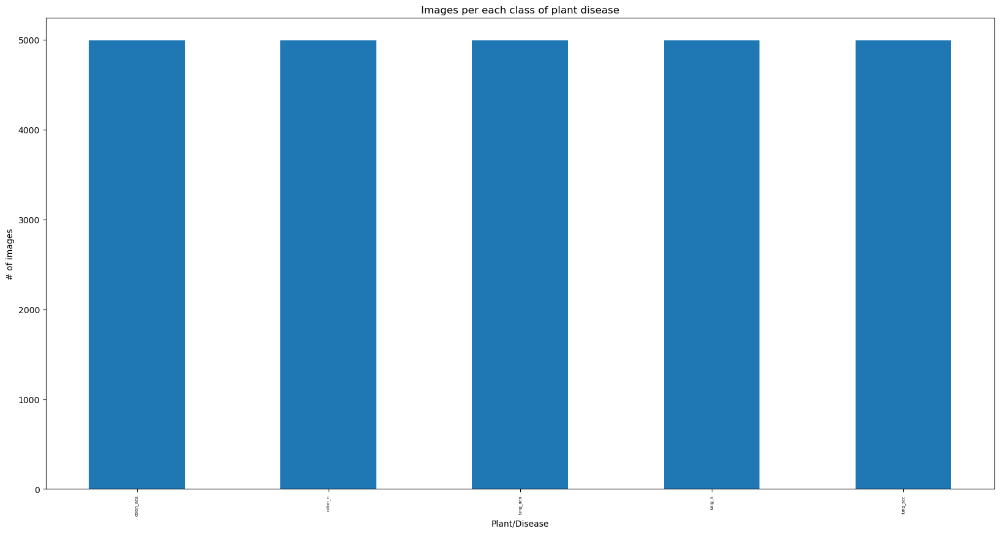

In [17]:
idx = [i for i in range(len(classes))]
plt.figure(figsize = (20,10))
plt.bar(idx , [n for n in num_of_disease.values()] , width = 0.5)
plt.xlabel('Plant/Disease' , fontsize = 10) 
plt.ylabel('# of images')
plt.xticks(idx , classes , fontsize = 5 , rotation = 90)
plt.title('Images per each class of plant disease')

In [18]:
dataset_path_list=[]
dataset_labels=[]
for cat in tqdm(os.listdir(dataset_path)) : 
    for folder in os.listdir(dataset_path + "/" + cat) : 
        files=gb.glob(pathname = str(dataset_path + "/" + cat + "/" + folder + "/*.jpeg"))
        for file in files : 
            dataset_path_list.append(file)
            dataset_labels.append(img_label[cat.replace('_image_sets','')][folder])

  0%|          | 0/2 [00:00<?, ?it/s]

In [19]:
len(dataset_path_list) , len(dataset_labels)

(24950, 24950)

In [20]:
np.unique(dataset_labels)

array([0, 1, 2, 3, 4])

In [21]:
pred_path_list = [] 
pred_labels = [] 
for cat in tqdm(os.listdir(pred_path)) : 
    for folder in os.listdir(pred_path + "/" + cat) : 
        files = gb.glob(pathname = str(pred_path + "/" + cat + "/" + folder + "/*.jpeg"))
        for file in files : 
            pred_path_list.append(file) 
            pred_labels.append(img_label[cat.replace('_image_sets','')][folder])

  0%|          | 0/2 [00:00<?, ?it/s]

In [22]:
len(pred_path_list) , len(pred_labels)

(50, 50)

In [23]:
np.unique(pred_labels)

array([0, 1, 2, 3, 4])

In [24]:
img_size=250

# Split dataset

In [25]:
train_path_list , test_path_list , train_labels , test_labels = train_test_split(dataset_path_list , dataset_labels , train_size=0.80 , random_state=0)

In [26]:
print(f"The size of the training set is : {len(train_path_list)}")
print(f"The size of the testing set is : {len(test_path_list)}")

The size of the training set is : 19960
The size of the testing set is : 4990


# Gettting images into tensors

In [27]:
 basic_transform=transforms.Compose([
     transforms.Resize(size=(img_size,img_size)) , 
     transforms.ToTensor()
 ])

In [28]:
class InvalidDatasetException(Exception):
    
    def __init__(self,len_of_paths,len_of_labels):
        super().__init__(
            f"Number of paths ({len_of_paths}) is not compatible with number of labels ({len_of_labels})"
        )

In [29]:
class train_data(Dataset) : 
    def __init__(self,train_path , train_label , transform_method) : 
        self.train_path=train_path 
        self.train_label=train_label 
        self.transform_method = transform_method 
        if len(self.train_path) != len(self.train_label):
            raise InvalidDatasetException(self.train_path,self.train_label)
            
            
    def __len__(self) : 
        return len(self.train_path)
    
    
    def __getitem__(self,index) : 
        image=Image.open(self.train_path[index])
        tensor_image=self.transform_method(image)
        label=self.train_label[index]
        
        return tensor_image , label 

In [30]:
train_set = train_data(train_path_list , train_labels , basic_transform) 

In [31]:
np.unique(train_set.train_label)

array([0, 1, 2, 3, 4])

In [32]:
train_set.__len__()

19960

In [33]:
filer_train_image=train_set.__getitem__(1000)

In [34]:
filer_train_image[0].shape

torch.Size([3, 250, 250])

In [35]:
getlabel(filer_train_image[1])

('lung', 'lung_aca')

In [36]:
class test_data(Dataset) : 
    def __init__(self,test_path , test_label , transform_method) : 
        self.test_path = test_path 
        self.test_label = test_label 
        self.transform_method = transform_method 
        if len(self.test_path) != len(self.test_label):
            raise InvalidDatasetException(self.test_path,self.test_label)
            
             
    def __len__(self) : 
        return len(self.test_path) 
    
    
    def __getitem__(self,index) : 
        image=Image.open(self.test_path[index])
        tensor_image = self.transform_method(image)
        label=self.test_label[index]
        
        return tensor_image , label

In [37]:
test_set = test_data(test_path_list , test_labels , basic_transform)

In [38]:
np.unique(test_set.test_label)

array([0, 1, 2, 3, 4])

In [39]:
test_set.__len__()

4990

In [40]:
filer_test_image = test_set.__getitem__(2000)

In [41]:
filer_test_image[0].shape

torch.Size([3, 250, 250])

In [42]:
getlabel(filer_test_image[1])

('colon', 'colon_aca')

In [43]:
class pred_data(Dataset) : 
    def __init__(self, pred_path , transform_method) : 
        self.pred_path = pred_path 
        self.transform = transform_method 
        
        
    def __len__(self) : 
        return len(self.pred_path)
    
    
    def __getitem__(self , index) : 
        image = Image.open(self.pred_path[index])
        tensor_image = self.transform(image)
        
        return tensor_image

In [44]:
pred_set = pred_data(pred_path_list , basic_transform)

In [45]:
print(f"The number of images in the pred set is : {pred_set.__len__()}")

The number of images in the pred set is : 50


In [46]:
filer_pred_image = pred_set.__getitem__(15)

In [47]:
filer_pred_image.shape

torch.Size([3, 250, 250])

In [48]:
BATCH_SIZE = 128

# Creating dataloaders

In [49]:
torch.manual_seed(42)
train_dataloader=DataLoader(
    dataset=train_set , 
    batch_size = BATCH_SIZE , 
    shuffle = True 
)

In [50]:
torch.manual_seed(42)
test_dataloader=DataLoader(
    dataset=test_set , 
    batch_size = BATCH_SIZE , 
    shuffle=False 
)

In [51]:
torch.manual_seed(42)
pred_dataloader = DataLoader(
    dataset = pred_set , 
    batch_size = pred_set.__len__() , 
    shuffle = False
)

In [52]:
print(f"the size of the train dataloader {len(train_dataloader)} batches of {BATCH_SIZE}")

the size of the train dataloader 156 batches of 128


In [53]:
trainimage_sample , trainlabel_sample = next(iter(train_dataloader)) 
trainimage_sample.shape , trainlabel_sample.shape

(torch.Size([128, 3, 250, 250]), torch.Size([128]))

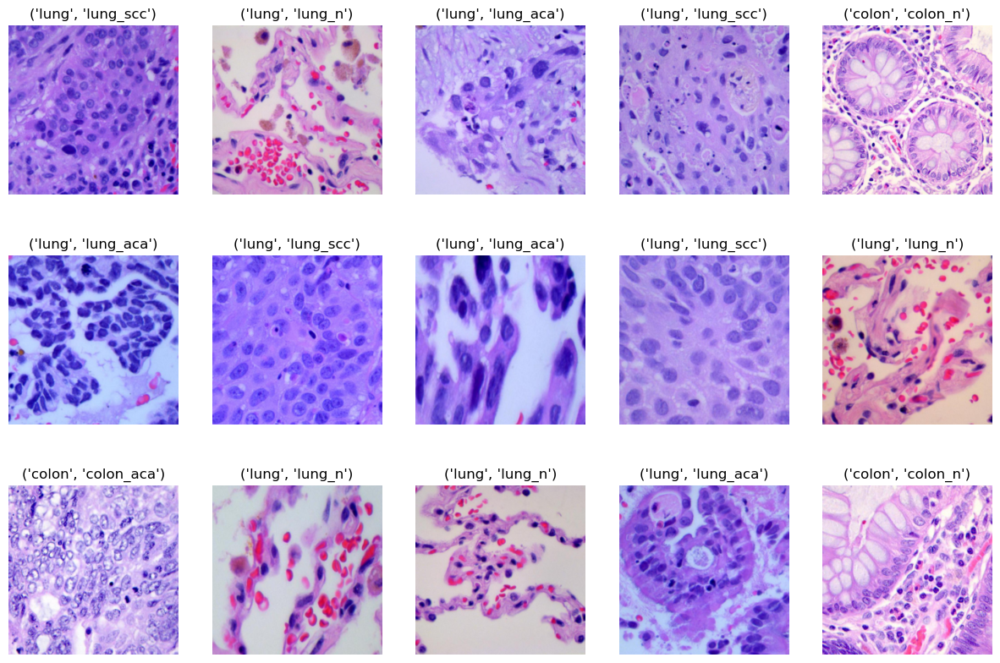

In [54]:
fig, axis = plt.subplots(3, 5, figsize=(15, 10))
for i, ax in enumerate(axis.flat):
    with torch.no_grad():
        img = trainimage_sample[i].numpy()
        img = np.transpose(img, (1, 2, 0))
        ax.imshow(img)
        ax.set(title = f"{getlabel(trainlabel_sample[i])}")
        ax.axis('off')

In [55]:
print(f"the size of the test dataloader {len(test_dataloader)} batches of {BATCH_SIZE}")

the size of the test dataloader 39 batches of 128


In [56]:
testimage_sample , testlabel_sample = next(iter(test_dataloader))
testimage_sample.shape , testlabel_sample.shape 

(torch.Size([128, 3, 250, 250]), torch.Size([128]))

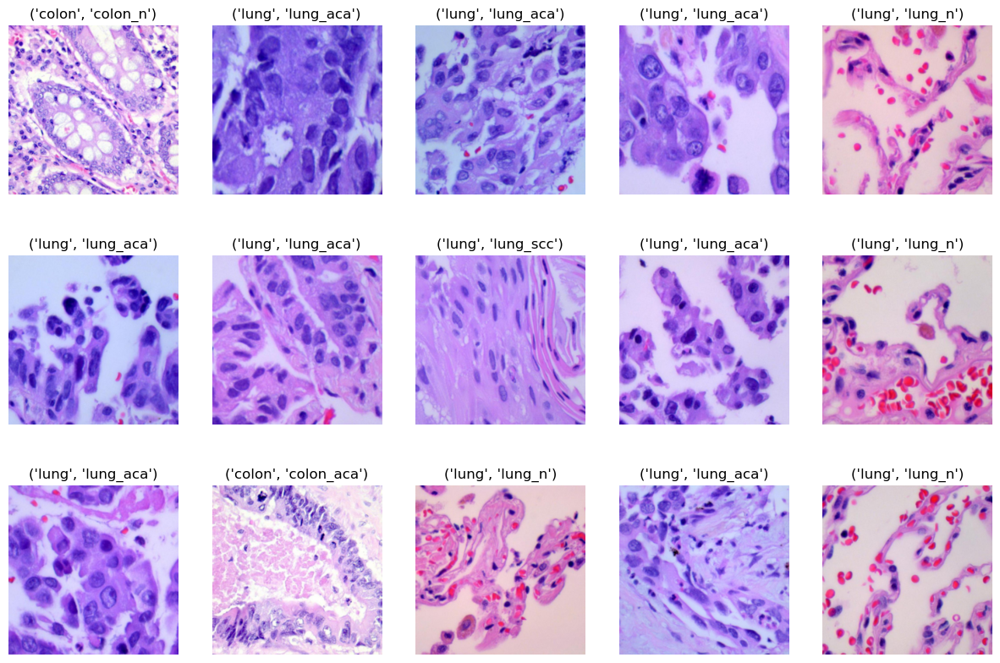

In [57]:
fig, axis = plt.subplots(3, 5, figsize=(15, 10))
for i, ax in enumerate(axis.flat):
    with torch.no_grad():
        img = testimage_sample[i].numpy()
        img = np.transpose(img, (1, 2, 0))
        ax.imshow(img)
        ax.set(title = f"{getlabel(testlabel_sample[i])}")
        ax.axis('off')

In [58]:
print(f"the size of the pred dataloader {len(pred_dataloader)}")

the size of the pred dataloader 1


In [59]:
predimage_sample = next(iter(pred_dataloader))
predimage_sample.shape

torch.Size([50, 3, 250, 250])

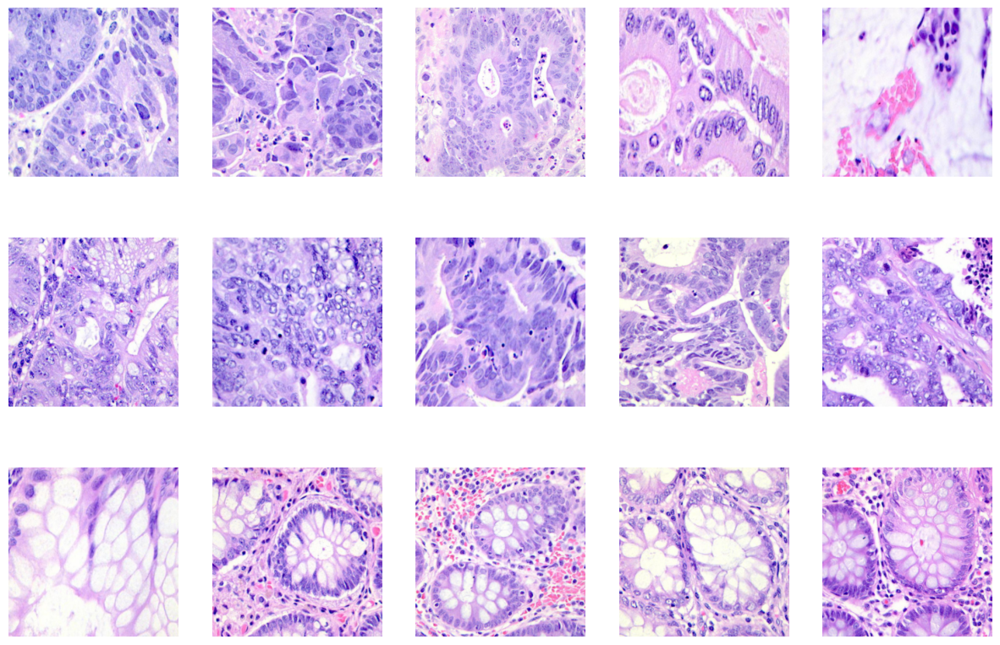

In [60]:
fig, axis = plt.subplots(3, 5, figsize=(15, 10))
for i, ax in enumerate(axis.flat):
    with torch.no_grad():
        img = predimage_sample[i].numpy()
        img = np.transpose(img, (1, 2, 0))
        ax.imshow(img)
        ax.axis('off')

In [61]:
def param_count(model):
    params = [p.numel() for p in model.parameters() if p.requires_grad]
    print('Total number of parameters : ', sum(params))

# Build the model

In [62]:
class CNN(nn.Module) : 
    def __init__(self,input_shape , output) : 
        super().__init__()
        self.block1=nn.Sequential(
            nn.Conv2d(
                in_channels=input_shape , 
                out_channels=32 , 
                kernel_size=(3,3) , 
                stride=2 , 
                padding = 1 
            ) , 
            
            nn.ReLU() , 
            
            nn.Conv2d(
                in_channels=32 , 
                out_channels=64 , 
                kernel_size=(3,3) , 
                stride=2 , 
                padding=1 
            ) , 
            
            nn.ReLU() , 
            
            nn.MaxPool2d(kernel_size=2)
        )
        
        self.block2=nn.Sequential(
            nn.Conv2d(
                in_channels=64 , 
                out_channels=128 , 
                kernel_size=(3,3) , 
                stride = 2 , 
                padding = 1 
            ) , 
            
            nn.ReLU() , 
            
            nn.Conv2d(
                in_channels=128 , 
                out_channels=256 , 
                kernel_size = (3,3) , 
                stride = 2 , 
                padding = 1 
            ) ,
            
            nn.ReLU() , 
            
            nn.MaxPool2d(kernel_size=2)
        )
        
        self.fully_connected_layer=nn.Sequential(
            nn.Flatten() , 
            nn.Linear(in_features=256*4*4
                      , out_features=output)
        )
        
        
    def forward(self,x) : 
        x=self.block1(x) 
#         print(f"The output shape of conv block1 is : {x.shape}\n\n")
        x=self.block2(x) 
#         print(f"The output shape of conv block2 is : {x.shape}\n\n")
        x=self.fully_connected_layer(x)
        return x

In [63]:
torch.manual_seed(42)
model=CNN(
    input_shape = 3 , 
    output=len(classes)
)

In [64]:
model.parameters

<bound method Module.parameters of CNN(
  (block1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(32, 64, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (block2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (1): ReLU()
    (2): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (3): ReLU()
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (fully_connected_layer): Sequential(
    (0): Flatten(start_dim=1, end_dim=-1)
    (1): Linear(in_features=4096, out_features=5, bias=True)
  )
)>

In [65]:
param_count(model)

Total number of parameters :  408901


In [66]:
in_shape = (3, 250, 250)
print(summary(model, (in_shape)))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 32, 125, 125]             896
              ReLU-2         [-1, 32, 125, 125]               0
            Conv2d-3           [-1, 64, 63, 63]          18,496
              ReLU-4           [-1, 64, 63, 63]               0
         MaxPool2d-5           [-1, 64, 31, 31]               0
            Conv2d-6          [-1, 128, 16, 16]          73,856
              ReLU-7          [-1, 128, 16, 16]               0
            Conv2d-8            [-1, 256, 8, 8]         295,168
              ReLU-9            [-1, 256, 8, 8]               0
        MaxPool2d-10            [-1, 256, 4, 4]               0
          Flatten-11                 [-1, 4096]               0
           Linear-12                    [-1, 5]          20,485
Total params: 408,901
Trainable params: 408,901
Non-trainable params: 0
-------------------------------

# Setting the cost function and the optimizer

In [67]:
criterion=nn.CrossEntropyLoss()
optimizer=Adam(model.parameters(),lr=0.001)

# Training the model

In [68]:
epochs = 10 
training_acc = [] 
training_loss = [] 

for i in tqdm(range(epochs)) : 
    epoch_loss = 0 
    epoch_acc = 0 
    
    for batch , (x_train , y_train) in enumerate(train_dataloader) : 
        y_pred = model.forward(x_train) 
        
        loss = criterion(y_pred , y_train) 
        
        if batch % 100 == 0:
            print(f"Looked at {batch * len(x_train)}/{len(train_dataloader.dataset)} samples.")
            
            
        loss.backward()
        optimizer.step()
        optimizer.zero_grad() 
        
        
        epoch_loss +=loss 
        epoch_acc += accuracy_score(y_train , y_pred.argmax(dim=1))
        
    training_loss.append((epoch_loss/len(train_dataloader)).detach().numpy())
    training_acc.append(epoch_acc/len(train_dataloader))
    
    print(f"Epoch {i}: Accuracy: {(epoch_acc/len(train_dataloader)) * 100}, Loss: {(epoch_loss/len(train_dataloader))}\n\n")

  0%|          | 0/10 [00:00<?, ?it/s]

Looked at 0/19960 samples.
Looked at 12800/19960 samples.
Epoch 0: Accuracy: 72.05662393162393, Loss: 0.6324043273925781


Looked at 0/19960 samples.
Looked at 12800/19960 samples.
Epoch 1: Accuracy: 86.26502403846155, Loss: 0.3355960547924042


Looked at 0/19960 samples.
Looked at 12800/19960 samples.
Epoch 2: Accuracy: 90.3976362179487, Loss: 0.24340961873531342


Looked at 0/19960 samples.
Looked at 12800/19960 samples.
Epoch 3: Accuracy: 92.57111378205127, Loss: 0.184391587972641


Looked at 0/19960 samples.
Looked at 12800/19960 samples.
Epoch 4: Accuracy: 93.38141025641026, Loss: 0.16330713033676147


Looked at 0/19960 samples.
Looked at 12800/19960 samples.
Epoch 5: Accuracy: 95.01101762820512, Loss: 0.12326684594154358


Looked at 0/19960 samples.
Looked at 12800/19960 samples.
Epoch 6: Accuracy: 95.8780715811966, Loss: 0.1054549440741539


Looked at 0/19960 samples.
Looked at 12800/19960 samples.
Epoch 7: Accuracy: 96.42694978632478, Loss: 0.0886186957359314


Looked at 0/1996

In [69]:
print(f"The loss of the training set is : {training_loss[-1]}")
print(f"The accuracy of the training set is : {training_acc[-1]:0.3f}%")

The loss of the training set is : 0.062379684299230576
The accuracy of the training set is : 0.976%


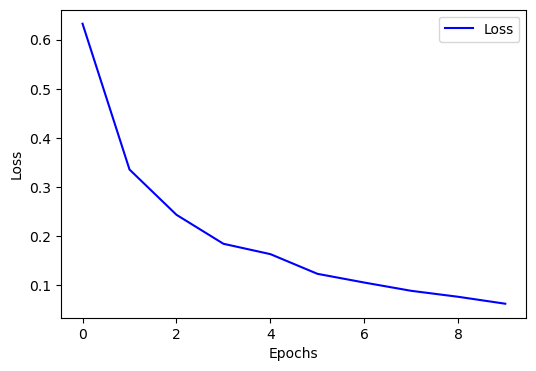

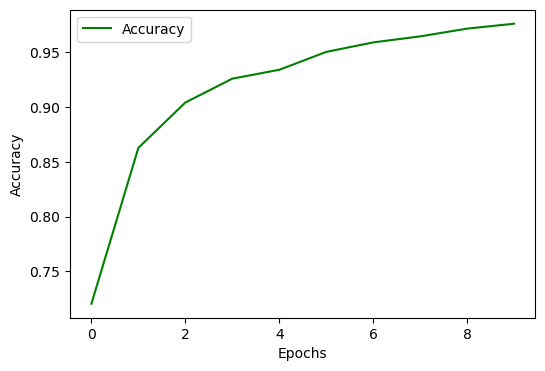

In [70]:
plt.subplots(figsize=(6,4))
plt.plot(range(epochs),training_loss,color="blue",label="Loss")
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

plt.subplots(figsize=(6,4))
plt.plot(range(epochs),training_acc,color="green",label="Accuracy")
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Model Evaluation

In [71]:
test_loss=0
test_acc= 0
test_preds=[]
test_targets = []
torch.manual_seed(42)
with torch.no_grad() : 
        for x_test , y_test in test_dataloader : 
            y_pred=model.forward(x_test)
            test_pred = torch.softmax(y_pred , dim=1 ).argmax(dim=1)
            test_preds.append(test_pred)
            test_targets.extend(y_test)
            
            loss=criterion(y_pred,y_test)
            test_loss+=loss
            test_acc += accuracy_score(y_test , y_pred.argmax(dim=1))
            
            
test_loss/=len(test_dataloader)
test_acc/=len(test_dataloader)
test_preds = torch.cat(test_preds)
test_targets = torch.Tensor(test_targets)

In [72]:
print(f"The loss of the testing set is : {test_loss}\n")
print(f"The accuracy of the testing set is : {(test_acc*100):0.2f}%\n")

The loss of the testing set is : 0.07616529613733292

The accuracy of the testing set is : 97.07%



# Make predictions

In [73]:
y_preds = [] 

torch.manual_seed(42)
with torch.no_grad() : 
    for x  in pred_dataloader : 
        y_pred = model.forward(x) 
        
        y_pred = torch.softmax(y_pred , dim=1 ).argmax(dim=1)
        y_preds.append(y_pred)
        
y_preds = torch.cat(y_preds)

In [74]:
x_preds_samples = next(iter(pred_dataloader))
x_preds_samples.shape

torch.Size([50, 3, 250, 250])

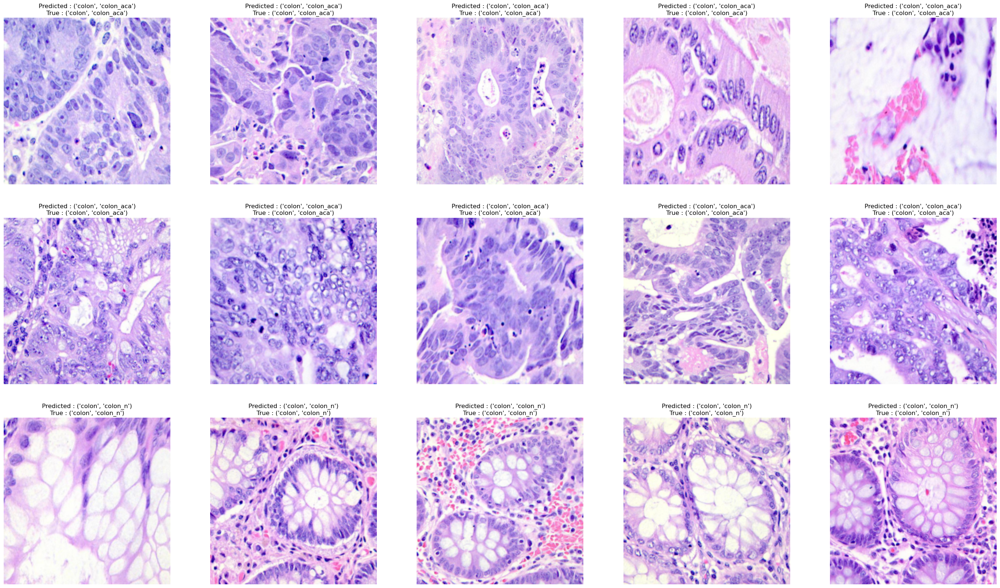

In [75]:
fig, axis = plt.subplots(3, 5, figsize=(35, 20))
for i, ax in enumerate(axis.flat):
    with torch.no_grad():
        img = x_preds_samples[i].numpy()
        img = np.transpose(img, (1, 2, 0))
        ax.imshow(img)
        ax.set(title = f"Predicted : {getlabel(y_preds[i])}\nTrue : {getlabel(pred_labels[i])}")
        ax.axis('off')

# Measuring performance

In [76]:
print(f"The accuracy of the training set is : {(training_acc[-1] * 100):0.2f}%")
print(f"The accuracy of the testing set is : {(test_acc*100):0.2f}%\n")
print(f"\nRecall : {recall_score(test_targets,test_preds,average='weighted')}")
print(f"\nPrecision : {precision_score(test_targets,test_preds,average='weighted')}")
print(f"\nF1 Score {f1_score(test_targets,test_preds,average='weighted')}\n")

The accuracy of the training set is : 97.58%
The accuracy of the testing set is : 97.07%


Recall : 0.9707414829659319

Precision : 0.9713819887953404

F1 Score 0.9707347283830798



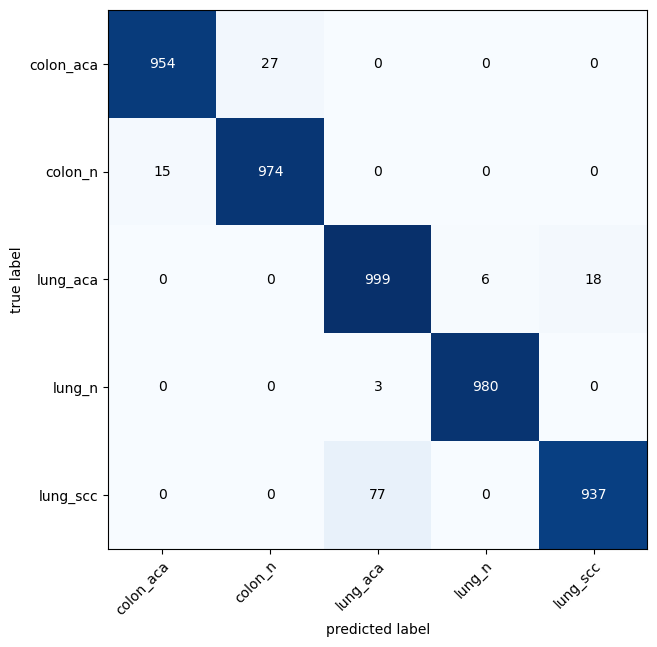

In [77]:
confmat = ConfusionMatrix(num_classes=len(classes), task='multiclass')
confmat_tensor = confmat(preds=test_preds,
                         target=test_targets)

fig, ax = plot_confusion_matrix(
    conf_mat=confmat_tensor.numpy(),
    class_names=classes,
    figsize=(10, 7)
)

# Save our model

In [78]:
torch.save(model.state_dict(), 'lung-and-colon-cancer-classification.pt')